In [1]:
using Distributions
using DataFrames
using Plots; gr(); #plotlyjs()
using Printf

# Motivation

# 準備

## 混合正規分布

$$
p(\mathbf{x})=\sum_{k=1}^{K} \pi_{k} \mathcal{N}(\mathbf{x} | \boldsymbol{\mu}_{k}, \boldsymbol{\Sigma}_{k})
$$

In [2]:
N1 = MvNormal([0.;0.], [1. 0.;0. 1.])
N2 = MvNormal([4.;3.], [2. 1.;1. 3.])
N3 = MvNormal([-2.;-5.], [3. 2.;2. 5.])
π1 = 0.2; π2 = 0.5; π3 = 0.3; 
@assert π1 + π2 + π3 == 1
@assert π1 >= 0 and π2 >= 0 and π3 >= 0
MoG = MixtureModel(
    MvNormal[N1, N2, N3],
    [π1, π2, π3 ]
);

In [26]:
function plot_contour()
    xs = ys = -10:0.1:10
    zs = [pdf(MoG, [x, y]) for x in xs, y in ys]'
    plot(xs, ys, zs; st=:surface)
end
plot_contour()

In [29]:
function MoG_rand(;n_samples=100)
    samples = [rand(N1, Int(n_samples * π1)) rand(N2, Int(n_samples * π2)) rand(N3, Int(n_samples * π3))]
    indices = [ones(Int(nsamples * π1))' 2*ones(Int(nsamples * π2))' 3*ones(Int(nsamples * π3))']'
    return DataFrame(
        x = samples[1, :], y = samples[2, :], idx = indices
    )
end
function plot_samples!(samples_df)
    scatter!(samples_df[:x], samples_df[:y], zeros(nsamples); markersize=1)
end
n_samples = 1000
samples_df = MoG_rand(n_samples=nsamples);

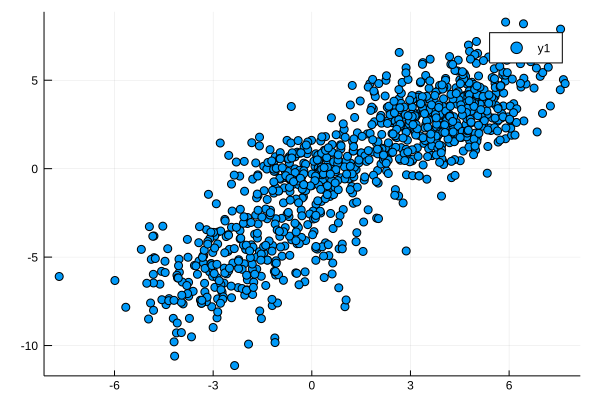

In [30]:
plot(samples_df[:x], samples_df[:y], st=:scatter)

In [ ]:
xs = ys = -10:0.1:10
zs = [pdf(MoG, [x, y]) for x in xs, y in ys]'
plot_contour()
plot_samples!(samples_df)

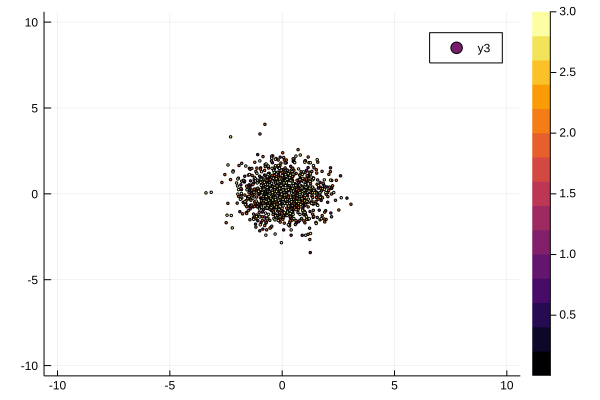

In [15]:
plot_samples(samples_df)
plot_contour()

In [6]:
nsamples = 1000
samples = rand(MoG, nsamples)
plot_contour()
scatter!(samples[1, :], samples[2, :], zeros(nsamples); markersize=1)

ErrorException: cannot assign variable Distributions.nsamples from module Main

In [ ]:
function plot_sample()
    xs = ys = -10:0.1:10
    zs = [pdf(MoG, [x, y]) for x in xs, y in ys]'
    plot(xs, ys, zs)
end
plot_contour()

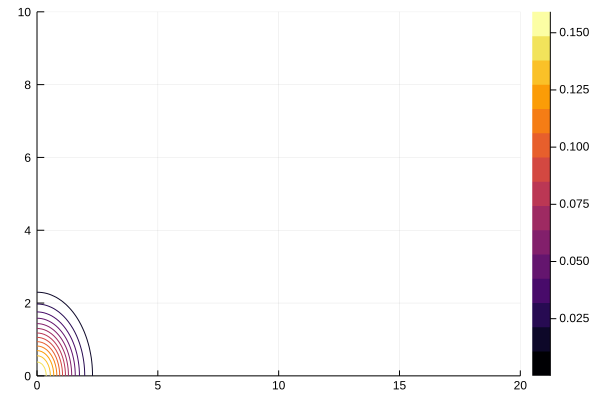

In [75]:
plot(x, y, z)

In [70]:
f(x,y) = (3x + y^2) * abs(sin(x) + cos(y))

x = 0:0.1:20
y = 0:0.1:10
z = [f(i,j) for i in x, j in y]' # この転置を忘れるとデータが矛盾し、グラフが変になるので要注意．

plot(x,y,z, st=:surface)

In [14]:
f(x, y) = pdf(d2, [x; y])

f (generic function with 1 method)

In [19]:
pdf(d2, [range; range])

301-element Array{Float64,1}:
 3.058874812474058e-99 
 6.082781330230255e-98 
 1.1856508460908719e-96
 2.2652990203251928e-95
 4.2423683017124445e-94
 7.7876300361637e-93   
 1.40125238303024e-91  
 2.4713913782069874e-90
 4.272487498910316e-89 
 7.239926953612484e-88 
 1.2025459460949315e-86
 1.9578674360931822e-85
 3.124488985230433e-84 
 ⋮                     
 1.9578674360931822e-85
 1.2025459460949315e-86
 7.239926953612484e-88 
 4.272487498910316e-89 
 2.4713913782069874e-90
 1.40125238303024e-91  
 7.7876300361637e-93   
 4.2423683017124445e-94
 2.2652990203251928e-95
 1.1856508460908719e-96
 6.082781330230255e-98 
 3.058874812474058e-99 

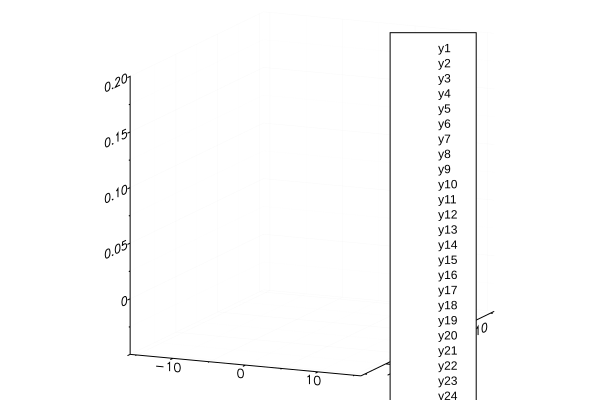

In [20]:
plot(range, range, pdf(d2, [range; range])')

In [72]:
range = (-15:0.1:15)'

1×301 LinearAlgebra.Adjoint{Float64,StepRangeLen{Float64,Base.TwicePrecision{Float64},Base.TwicePrecision{Float64}}}:
 -15.0  -14.9  -14.8  -14.7  -14.6  …  14.5  14.6  14.7  14.8  14.9  15.0

In [73]:
pdf(norm1, [range; range])

301-element Array{Float64,1}:
 3.058874812474058e-99 
 6.082781330230255e-98 
 1.1856508460908719e-96
 2.2652990203251928e-95
 4.2423683017124445e-94
 7.7876300361637e-93   
 1.40125238303024e-91  
 2.4713913782069874e-90
 4.272487498910316e-89 
 7.239926953612484e-88 
 1.2025459460949315e-86
 1.9578674360931822e-85
 3.124488985230433e-84 
 ⋮                     
 1.9578674360931822e-85
 1.2025459460949315e-86
 7.239926953612484e-88 
 4.272487498910316e-89 
 2.4713913782069874e-90
 1.40125238303024e-91  
 7.7876300361637e-93   
 4.2423683017124445e-94
 2.2652990203251928e-95
 1.1856508460908719e-96
 6.082781330230255e-98 
 3.058874812474058e-99 

In [66]:
pdf(norm1, [1 1 1; 1 1 1])

3-element Array{Float64,1}:
 0.05854983152431917
 0.05854983152431917
 0.05854983152431917

In [64]:
pdf(norm1, [1 1; 1 1; 3 3]')

3-element Array{Float64,1}:
 0.05854983152431917 
 0.05854983152431917 
 1.964128034639742e-5

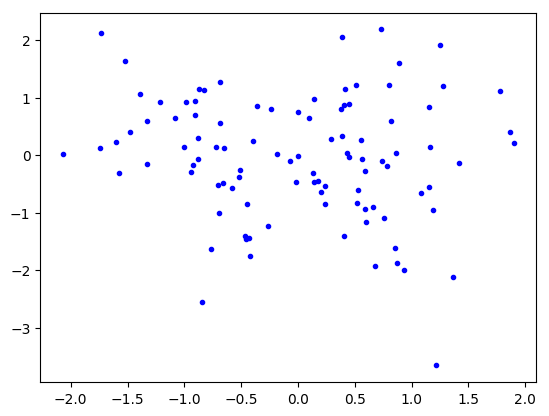

1-element Array{PyCall.PyObject,1}:
 PyObject <matplotlib.lines.Line2D object at 0x7f901039ae10>

In [53]:
plot(xs1[1, :], xs1[2, :], "b.")

In [28]:
μ1 = 0; σ1 = [1 0; 0 1]
μ2 = 5; σ2 = 3
μ3 = -7; σ3 = 2
norm1 = Normal(μ1, σ1)
norm2 = Normal(μ2, σ2)
norm3 = Normal(μ3, σ3)
nsamples = 10
xs1 = rand(norm1, nsamples)
xs2 = rand(norm2, nsamples)
xs3 = rand(norm3, nsamples);

In [29]:
df = DataFrame(
    x = [xs1; xs2; xs3],
    label = Int[ones(nsamples); 2*ones(nsamples); 3*ones(nsamples)]
)
first(df, 6)

,x,label
,Float64,Int64
1,-1.16812,1
2,-0.910994,1
3,-1.41591,1
4,1.46509,1
5,-1.27674,1
6,-0.575167,1


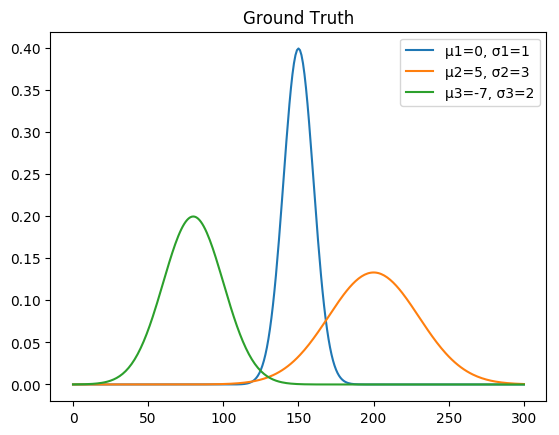

In [35]:
range = -15:0.1:15
plot(pdf.(norm1, range), label=@sprintf("μ1=%d, σ1=%d", μ1, σ1))
plot(pdf.(norm2, range), label=@sprintf("μ2=%d, σ2=%d", μ2, σ2))
plot(pdf.(norm3, range), label=@sprintf("μ3=%d, σ3=%d", μ3, σ3))
title("Ground Truth")
legend();

隠れ変数$\theta=()$を用いて，